In [6]:
import os
import io
import boto3
import os.path
import json
import glob
import pandas as pd
import random
import requests
import numpy as np
from tqdm import tqdm
from PIL import Image
from datetime import datetime
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
s3_client = boto3.client('s3')
bucket = 'reddit-meme-img'

# Reddit

In [20]:
def plot_match_data(max_len, images1, images2):
    nrows, ncols = min(3, max_len), 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 15))
    image1, image2 = "", "" 
    for i in range(min(3, max_len)):
        print(images1[i])
        file_byte_string = s3_client.get_object(Bucket=bucket, Key=images1[i])['Body'].read()
        image1 = Image.open(io.BytesIO(file_byte_string))
        axes[i, 0].imshow(image1)
        axes[i, 0].axis('off')
        image2 = Image.open(requests.get(images2[i], stream=True).raw)
        axes[i, 1].imshow(image2)
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

meme/s1vcopevtx9b1.jpg
ProgrammerHumor/egcy3qeehicb1.jpg
memes/7nun8tqeocab1.jpg


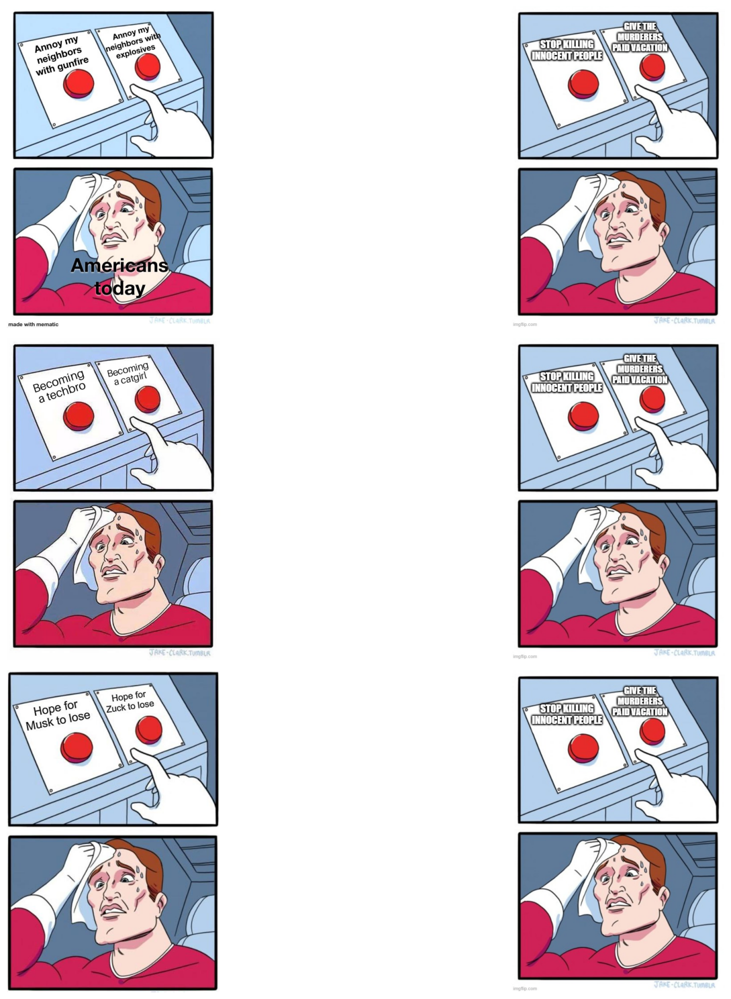

In [22]:
filtered_df = pd.read_csv('../out/filtered_df_60_final.csv')
# filtered_df = filtered_df[filtered_df['imkg image']=="https://i.imgflip.com/1gndfw.jpg"] 
# filtered_df = filtered_df[filtered_df['imkg image']=="https://i.imgflip.com/105k0j.jpg"] 
filtered_df = filtered_df[filtered_df['imkg image']=="https://i.imgflip.com/431kiz.jpg"] 
images1 = list(filtered_df['reddit image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)

# Discord

In [26]:
def plot_match_data(max_len, images1, images2):
    nrows, ncols = min(3, max_len), 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 50))
    image1, image2 = "", "" 
    for i in range(min(3, max_len)):
        print(images1[i])
        image1 = Image.open(requests.get(images1[i], stream=True).raw)
        axes[i, 0].imshow(image1)
        axes[i, 0].axis('off')
        image2 = Image.open(requests.get(images2[i], stream=True).raw)
        axes[i, 1].imshow(image2)
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

https://images-ext-1.discordapp.net/external/PYel-c6U38QBQuHNuBm-9cGr4OrmgLwdibiLuS6E2GE/https/i.redd.it/m5m81mr5vfeb1.jpg
https://images-ext-2.discordapp.net/external/XXlyPA9M08QcAxZoxKfQdeTsi-xVyTA6O3ENy7qmF38/https/i.redd.it/qgbd9a7hpdeb1.jpg
https://images-ext-1.discordapp.net/external/Teem5_54Zn3htRoB8iJdbcC0iB_0gH0N6RynygZwByA/https/i.redd.it/pnnsi26018db1.jpg


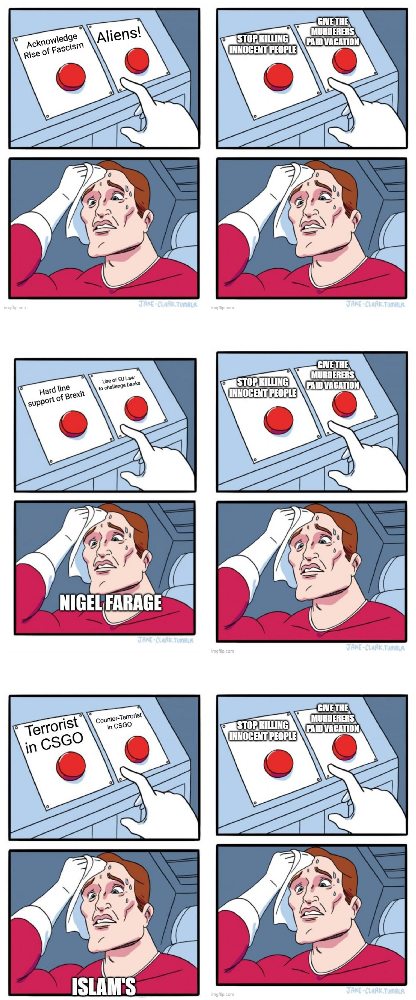

In [29]:
filtered_df = pd.read_csv('../out/discord_filtered_df_60_final.csv')
# filtered_df = filtered_df[filtered_df['imkg image']=="https://i.imgflip.com/1gndfw.jpg"] 
# filtered_df = filtered_df[filtered_df['imkg image']=="https://i.imgflip.com/105k0j.jpg"] 
filtered_df = filtered_df[filtered_df['imkg image']=="https://i.imgflip.com/431kiz.jpg"] 
images1 = list(filtered_df['discord image'].values)
images2 = list(filtered_df['imkg image'].values)
plot_match_data(len(filtered_df), images1, images2)